# DATA 603 Project
 ### Group Members:
 - Abhinav Reddy Mandadi
 - Koushik Reddy
 - Sai Teja Avadotha
 - Sushanthik Reddy Poreddy
 - Swapan Gupta Cholleti

In [3]:
# import the jupyter notebook importer
import import_ipynb
from data603 import SparkLauncher
from data603 import HDFSLauncher

conf = SparkLauncher.get_spark_conf()
spark = SparkLauncher.get_spark_session(conf, pack_venv = False)
hdfs = HDFSLauncher.get_hdfs()

importing Jupyter notebook from /scratch/data603_sp2022/ty99095/data603/SparkLauncher.ipynb
importing Jupyter notebook from /scratch/data603_sp2022/ty99095/data603/HDFSLauncher.ipynb
Creating Spark Session: ty99095_data603_spark_20220512_223936


In [4]:
import import_ipynb
import pandas as pd
from pyspark.sql.functions import col
from pyspark.sql.functions import lit  
import pyarrow.fs as pfs
import numpy as np
from PIL import Image
import pyspark.sql.functions as F
import base64
import io
from pyspark.sql.types import DoubleType,BooleanType
import random
import keras
import matplotlib.pyplot as plt
from IPython.display import Image
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import imagenet_utils
import pandas as pd                             
import requests
import itertools
import shutil 
from zipfile import ZipFile
from io import BytesIO

In [5]:
hdfs.ls('/data/google_open_image/')

['/data/google_open_image/bboxes',
 '/data/google_open_image/ids',
 '/data/google_open_image/images',
 '/data/google_open_image/labels',
 '/data/google_open_image/masks',
 '/data/google_open_image/metadata',
 '/data/google_open_image/relationships',
 '/data/google_open_image/segmentations']

In [6]:
table1=spark.read.csv('/data/google_open_image/metadata/class-descriptions-boxable.csv')

In [7]:
table1=table1.withColumnRenamed("_c0","LabelName").withColumnRenamed("_c1","LabelText")
table1.show(5)

+-----------+----------+
|  LabelName| LabelText|
+-----------+----------+
|  /m/011k07|  Tortoise|
|/m/011q46kg| Container|
|  /m/012074|    Magpie|
|  /m/0120dh|Sea turtle|
|  /m/01226z|  Football|
+-----------+----------+
only showing top 5 rows



In [8]:
hdfs.ls('/data/google_open_image/labels')

['/data/google_open_image/labels/test-annotations-human-imagelabels-boxable.csv',
 '/data/google_open_image/labels/train-annotations-human-imagelabels-boxable.csv',
 '/data/google_open_image/labels/validation-annotations-human-imagelabels-boxable.csv']

In [9]:
hdfs.ls("/etl/google_open_image/images/")

['/etl/google_open_image/images/test.avro',
 '/etl/google_open_image/images/train_0.avro',
 '/etl/google_open_image/images/train_1.avro',
 '/etl/google_open_image/images/train_2.avro',
 '/etl/google_open_image/images/train_3.avro',
 '/etl/google_open_image/images/train_4.avro',
 '/etl/google_open_image/images/train_5.avro',
 '/etl/google_open_image/images/train_6.avro',
 '/etl/google_open_image/images/train_7.avro',
 '/etl/google_open_image/images/train_8.avro',
 '/etl/google_open_image/images/train_9.avro',
 '/etl/google_open_image/images/train_a.avro',
 '/etl/google_open_image/images/train_b.avro',
 '/etl/google_open_image/images/train_c.avro',
 '/etl/google_open_image/images/train_d.avro',
 '/etl/google_open_image/images/train_e.avro',
 '/etl/google_open_image/images/train_f.avro',
 '/etl/google_open_image/images/validation.avro']

# Finding Feature count in Training Dataset

In [10]:
train_table2 = spark.read.csv('/data/google_open_image/labels/train-annotations-human-imagelabels-boxable.csv', header = True)

In [11]:
initial_join_train = train_table2.join(table1, on = 'LabelName', how = 'inner')
initial_join_train.show(5)

+---------+----------------+------------+----------+---------+
|LabelName|         ImageID|      Source|Confidence|LabelText|
+---------+----------------+------------+----------+---------+
|/m/014j1m|000002b66c9c498e|verification|         0|    Apple|
|/m/014sv8|000002b66c9c498e|verification|         1|Human eye|
| /m/01599|000002b66c9c498e|verification|         0|     Beer|
| /m/015p6|000002b66c9c498e|verification|         0|     Bird|
|/m/015x4r|000002b66c9c498e|verification|         0| Cucumber|
+---------+----------------+------------+----------+---------+
only showing top 5 rows



In [12]:
hdfs.ls('/data/google_open_image/ids')

['/data/google_open_image/ids/test-images-with-rotation.csv',
 '/data/google_open_image/ids/train-images-boxable-with-rotation.csv',
 '/data/google_open_image/ids/validation-images-with-rotation.csv']

In [13]:
train_table3 = spark.read.csv('/data/google_open_image/ids/train-images-boxable-with-rotation.csv', header = True)

In [14]:
final_data_train = initial_join_train.join(train_table3, on = 'ImageID', how = 'inner')
final_data_train.show(10)

+----------------+---------+------------+----------+-------------+------+--------------------+--------------------+--------------------+--------------------+----------+--------------------+------------+--------------------+--------------------+--------+
|         ImageID|LabelName|      Source|Confidence|    LabelText|Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|    Author|               Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|
+----------------+---------+------------+----------+-------------+------+--------------------+--------------------+--------------------+--------------------+----------+--------------------+------------+--------------------+--------------------+--------+
|0001771c86cadcd6|/m/012w5l|verification|         0|       Ladder| train|https://farm7.sta...|https://www.flick...|https://creativec...|https://www.flick...|morebyless|Ruston-Bucyrus 11...|     1571302|3LSkIXW1HoxWEh/LK...|https://c5.stat

In [15]:
bounding_boxes_train = spark.read.csv('/data/google_open_image/bboxes/train-annotations-bbox.csv', header = True)

In [16]:
from pyspark.sql.types import DoubleType
bounding_boxes_train = bounding_boxes_train.withColumn("XMin", bounding_boxes_train['XMin'].cast(DoubleType()))
bounding_boxes_train = bounding_boxes_train.withColumn("XMax", bounding_boxes_train['XMax'].cast(DoubleType()))
bounding_boxes_train = bounding_boxes_train.withColumn("YMin", bounding_boxes_train['YMin'].cast(DoubleType()))
bounding_boxes_train = bounding_boxes_train.withColumn("YMax", bounding_boxes_train['YMax'].cast(DoubleType()))

In [17]:
final_join_train = final_data_train.join(bounding_boxes_train, on = ['ImageID','LabelName'], how = 'inner')
final_join_train.show(5)

+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+--------------------+----------------+------------+--------------------+--------------------+--------+------+----------+--------+--------+--------+--------+----------+-----------+---------+-----------+--------+
|         ImageID|LabelName|      Source|Confidence|LabelText|Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|              Author|           Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|Source|Confidence|    XMin|    XMax|    YMin|    YMax|IsOccluded|IsTruncated|IsGroupOf|IsDepiction|IsInside|
+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+--------------------+----------------+------------+--------------------+--------------------+--------+------+----------

#### Reading the Avro files of the training data

In [18]:
avro_0 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_0.avro')
avro_1 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_1.avro')
avro_2 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_2.avro')
avro_3 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_3.avro')
avro_4 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_4.avro')
avro_5 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_5.avro')
avro_6 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_6.avro')
avro_7 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_7.avro')
avro_8 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_8.avro')
avro_9 = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_9.avro')
avro_a = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_a.avro')
avro_b = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_b.avro')
avro_c = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_c.avro')
avro_d = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_d.avro')
avro_e = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_e.avro')
avro_f = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/train_f.avro')

In [19]:
avro_final = avro_0.union(avro_1).union(avro_2).union(avro_3).union(avro_4).union(avro_5).union(avro_6).union(avro_7).union(avro_8).union(avro_9).union(avro_a).union(avro_b).union(avro_c).union(avro_d).union(avro_e).union(avro_f)
avro_final.show(5)

+----------------+----------+------+--------------------+
|              id|    subset|format|                data|
+----------------+----------+------+--------------------+
|06B1DEF45D1557BF|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|063E4189611C4D00|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|02A98BDFA6E613E3|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|017236DF6E45E90C|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|0112037B723C0087|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
+----------------+----------+------+--------------------+
only showing top 5 rows



In [20]:
import pyspark.sql.functions as F
avro_final = avro_final.withColumn('id', F.lower(F.col("id")))
avro_final.show(5)

+----------------+----------+------+--------------------+
|              id|    subset|format|                data|
+----------------+----------+------+--------------------+
|06b1def45d1557bf|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|063e4189611c4d00|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|02a98bdfa6e613e3|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|017236df6e45e90c|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|0112037b723c0087|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
+----------------+----------+------+--------------------+
only showing top 5 rows



In [21]:
avro_final = avro_final.withColumnRenamed("id", "ImageID")

In [22]:
final_feature_train = final_join_train.join(avro_final, on = ['ImageID'], how = 'inner')
final_feature_train.show(5)

+----------------+----------+------------+----------+----------------+------+--------------------+--------------------+--------------------+--------------------+----------+--------------------+------------+--------------------+--------------------+--------+------+----------+--------+--------+--------+--------+----------+-----------+---------+-----------+--------+----------+------+--------------------+
|         ImageID| LabelName|      Source|Confidence|       LabelText|Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|    Author|               Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|Source|Confidence|    XMin|    XMax|    YMin|    YMax|IsOccluded|IsTruncated|IsGroupOf|IsDepiction|IsInside|    subset|format|                data|
+----------------+----------+------------+----------+----------------+------+--------------------+--------------------+--------------------+--------------------+----------+------------------

In [23]:
final_feature_train.groupby("LabelText").count().show()

+-------------+------+
|    LabelText| count|
+-------------+------+
|       Flower|345296|
|        Drink| 40323|
|     Goldfish|  2204|
|        Sword|   567|
|    Golf cart|   595|
|       Muffin|  4608|
|       Turtle|   205|
|         Oboe|   162|
|         Swan|  4523|
|         Tire|122615|
|        Goose|  8436|
|       Ladder|   994|
|      Dolphin|  1532|
|      Spatula|    64|
|      Missile|   603|
|       Shrimp|  1856|
|Bow and arrow|   594|
|        Tiara|   411|
|    Human leg| 71479|
|        Clock|  1222|
+-------------+------+
only showing top 20 rows



In [24]:
goldfish_train = final_feature_train.filter(col('LabelText').contains("Goldfish"))

In [25]:
print("Total Number of features count in train dataset is: ", goldfish_train.count())

Total Number of features count in train dataset is:  2204


### ---------------------------------------------------------------------------------------------------------

# Finding the Feature count in Test dataset

In [26]:
test_table2 = spark.read.csv('/data/google_open_image/labels/test-annotations-human-imagelabels-boxable.csv', header = True)

In [27]:
initial_join_test = test_table2.join(table1, on = 'LabelName', how = 'inner')
initial_join_test.show(5)

+---------+----------------+------------+----------+----------+
|LabelName|         ImageID|      Source|Confidence| LabelText|
+---------+----------------+------------+----------+----------+
| /m/0cgh4|000026e7ee790996|verification|         0|  Building|
|/m/04hgtk|000026e7ee790996|verification|         0|Human head|
| /m/0d5gx|000026e7ee790996|verification|         0|    Castle|
| /m/07j7r|000026e7ee790996|verification|         1|      Tree|
| /m/04rky|000026e7ee790996|verification|         0|    Mammal|
+---------+----------------+------------+----------+----------+
only showing top 5 rows



In [28]:
test_table3 = spark.read.csv('/data/google_open_image/ids/test-images-with-rotation.csv', header = True)

In [29]:
final_data_test = initial_join_test.join(test_table3, on = 'ImageID', how = 'inner')
final_data_test.show(10)

+----------------+----------+------------+----------+------------+------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------+--------------------+--------------------+--------+
|         ImageID| LabelName|      Source|Confidence|   LabelText|Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|              Author|               Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|
+----------------+----------+------------+----------+------------+------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------+--------------------+--------------------+--------+
|0019340fba652d43|  /m/07yv9|verification|         0|     Vehicle|  test|https://farm4.sta...|https://www.flick...|https://creativec...|https://www.flick...|             Alang7™|            DSCF3396|     4431

In [30]:
bounding_boxes_test = spark.read.csv('/data/google_open_image/bboxes/test-annotations-bbox.csv', header = True)

In [31]:
bounding_boxes_test = bounding_boxes_test.withColumn("XMin", bounding_boxes_test['XMin'].cast(DoubleType()))
bounding_boxes_test = bounding_boxes_test.withColumn("XMax", bounding_boxes_test['XMax'].cast(DoubleType()))
bounding_boxes_test = bounding_boxes_test.withColumn("YMin", bounding_boxes_test['YMin'].cast(DoubleType()))
bounding_boxes_test = bounding_boxes_test.withColumn("YMax", bounding_boxes_test['YMax'].cast(DoubleType()))

In [32]:
final_join_test = final_data_test.join(bounding_boxes_test, on = ['ImageID','LabelName'], how = 'inner')
final_join_test.show(5)

+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+-----------------+--------------------+------------+--------------------+--------------------+--------+------+----------+----------+----------+----------+----------+----------+-----------+---------+-----------+--------+
|         ImageID|LabelName|      Source|Confidence|LabelText|Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|           Author|               Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|Source|Confidence|      XMin|      XMax|      YMin|      YMax|IsOccluded|IsTruncated|IsGroupOf|IsDepiction|IsInside|
+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+-----------------+--------------------+------------+--------------------+--------------------+-------

In [33]:
avro_test = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/test.avro')

In [34]:
avro_test = avro_test.withColumn('id', F.lower(F.col("id")))
avro_test = avro_test.withColumnRenamed("id", "ImageID")
avro_test.show(5)

+----------------+----------+------+--------------------+
|         ImageID|    subset|format|                data|
+----------------+----------+------+--------------------+
|2b13330e9197afa9|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|f3276b944bbb9874|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|b49844caf0ecc14c|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|6e8b9ae2e27665d4|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|4efee32e35b0a7ec|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
+----------------+----------+------+--------------------+
only showing top 5 rows



In [35]:
final_feature_test = final_join_test.join(avro_test, on = ['ImageID'], how = 'inner')
final_feature_test.show(5)

+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------+--------------------+--------------------+--------+------+----------+-----------+----------+----------+----------+----------+-----------+---------+-----------+--------+----------+------+--------------------+
|         ImageID|LabelName|      Source|Confidence|LabelText|Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|              Author|               Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|Source|Confidence|       XMin|      XMax|      YMin|      YMax|IsOccluded|IsTruncated|IsGroupOf|IsDepiction|IsInside|    subset|format|                data|
+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+---------------

In [36]:
final_feature_test.groupby("LabelText").count().show()

+-------------+-----+
|    LabelText|count|
+-------------+-----+
|       Flower|18058|
|        Drink| 1937|
|    Golf cart|   36|
|     Goldfish|  207|
|        Sword|  123|
|         Oboe|   31|
|       Muffin|  455|
|       Turtle|   23|
|         Swan|  144|
|         Tire|21183|
|        Goose|  488|
|       Ladder|   83|
|      Dolphin|  252|
|      Spatula|    2|
|       Shrimp|  368|
|Bow and arrow|   71|
|        Tiara|   54|
|      Missile|   83|
|    Human leg|18818|
|        Clock|   67|
+-------------+-----+
only showing top 20 rows



In [37]:
goldfish_test = final_feature_test.filter(col('LabelText').contains("Goldfish"))

In [38]:
print("Total Number of features count in test dataset is: ", goldfish_test.count())

Total Number of features count in test dataset is:  207


### ---------------------------------------------------------------------------------------------------------

# Finding the Feature count in Validation Dataset

In [39]:
val_table2 = spark.read.csv('/data/google_open_image/labels/validation-annotations-human-imagelabels-boxable.csv', header = True)

In [40]:
initial_join_val = val_table2.join(table1, on = 'LabelName', how = 'inner')
initial_join_val.show(5)

+---------+----------------+------------+----------+-----------------+
|LabelName|         ImageID|      Source|Confidence|        LabelText|
+---------+----------------+------------+----------+-----------------+
| /m/0cmf2|0001eeaf4aed83f9|verification|         1|         Airplane|
|/m/01g317|0004886b7d043cfd|verification|         0|           Person|
|/m/04hgtk|0004886b7d043cfd|verification|         0|       Human head|
| /m/09j2d|0004886b7d043cfd|verification|         0|         Clothing|
|/m/0463sg|0004886b7d043cfd|verification|         0|Fashion accessory|
+---------+----------------+------------+----------+-----------------+
only showing top 5 rows



In [41]:
val_table3 = spark.read.csv('/data/google_open_image/ids/validation-images-with-rotation.csv', header = True)

In [42]:
final_data_val = initial_join_val.join(val_table3, on = 'ImageID', how = 'inner')
final_data_val.show(10)

+----------------+----------+------------+----------+------------+----------+--------------------+--------------------+--------------------+--------------------+----------+----------+------------+--------------------+--------------------+--------+
|         ImageID| LabelName|      Source|Confidence|   LabelText|    Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|    Author|     Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|
+----------------+----------+------------+----------+------------+----------+--------------------+--------------------+--------------------+--------------------+----------+----------+------------+--------------------+--------------------+--------+
|001464cfae2a30b8|  /m/05s2s|verification|         0|       Plant|validation|https://c1.static...|https://www.flick...|https://creativec...|https://www.flick...|  oknidius|McDonald's|     1202755|JBLROGGlzJ2qpoRH3...|https://c3.static...|     0.0|
|001464c

In [43]:
bounding_boxes_validation = spark.read.csv('/data/google_open_image/bboxes/validation-annotations-bbox.csv', header = True)

In [44]:
bounding_boxes_validation = bounding_boxes_validation.withColumn("XMin", bounding_boxes_validation['XMin'].cast(DoubleType()))
bounding_boxes_validation = bounding_boxes_validation.withColumn("XMax", bounding_boxes_validation['XMax'].cast(DoubleType()))
bounding_boxes_validation = bounding_boxes_validation.withColumn("YMin", bounding_boxes_validation['YMin'].cast(DoubleType()))
bounding_boxes_validation = bounding_boxes_validation.withColumn("YMax", bounding_boxes_validation['YMax'].cast(DoubleType()))

In [45]:
final_join_val = final_data_val.join(bounding_boxes_validation, on = ['ImageID','LabelName'], how = 'inner')
final_join_val.show(5)

+----------------+---------+------------+----------+---------+----------+--------------------+--------------------+--------------------+--------------------+---------+--------------------+------------+--------------------+--------------------+--------+------+----------+----------+----------+----------+----------+----------+-----------+---------+-----------+--------+
|         ImageID|LabelName|      Source|Confidence|LabelText|    Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|   Author|               Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|Source|Confidence|      XMin|      XMax|      YMin|      YMax|IsOccluded|IsTruncated|IsGroupOf|IsDepiction|IsInside|
+----------------+---------+------------+----------+---------+----------+--------------------+--------------------+--------------------+--------------------+---------+--------------------+------------+--------------------+--------------------+--------+------+---

In [46]:
avro_val = spark.read.format("com.databricks.spark.avro").load('/etl/google_open_image/images/validation.avro')

In [47]:
avro_val = avro_val.withColumn('id', F.lower(F.col("id")))
avro_val = avro_val.withColumnRenamed("id", "ImageID")
avro_val.show(5)

+----------------+----------+------+--------------------+
|         ImageID|    subset|format|                data|
+----------------+----------+------+--------------------+
|226f0a1873b9bf8e|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|5d3c2f6c07cce7d0|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|ab18b23ced0e9411|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|a07ec376bfa660b9|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
|964e1a1bf1d7db9d|VALIDATION|   JPG|[FF D8 FF E0 00 1...|
+----------------+----------+------+--------------------+
only showing top 5 rows



In [48]:
final_feature_val = final_join_val.join(avro_val, on = ['ImageID'], how = 'inner')
final_feature_val.show(5)

+----------------+----------+------------+----------+------------+----------+--------------------+--------------------+--------------------+--------------------+--------+----------+------------+--------------------+--------------------+--------+------+----------+----------+----------+----------+----------+----------+-----------+---------+-----------+--------+----------+------+--------------------+
|         ImageID| LabelName|      Source|Confidence|   LabelText|    Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|  Author|     Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|Source|Confidence|      XMin|      XMax|      YMin|      YMax|IsOccluded|IsTruncated|IsGroupOf|IsDepiction|IsInside|    subset|format|                data|
+----------------+----------+------------+----------+------------+----------+--------------------+--------------------+--------------------+--------------------+--------+----------+------------+----

In [49]:
final_feature_val.groupby("LabelText").count().show()

+-------------+-----+
|    LabelText|count|
+-------------+-----+
|        Drink|  604|
|       Flower| 5825|
|     Goldfish|   64|
|    Golf cart|    9|
|        Sword|   27|
|       Muffin|  130|
|       Turtle|    8|
|         Oboe|    6|
|         Swan|   52|
|         Tire| 6742|
|      Dolphin|   93|
|        Goose|  207|
|       Ladder|   27|
|      Spatula|    4|
|       Shrimp|  136|
|      Missile|   31|
|        Tiara|   14|
|Bow and arrow|   29|
|    Human leg| 5818|
|        Clock|   24|
+-------------+-----+
only showing top 20 rows



In [50]:
goldfish_val = final_feature_val.filter(col('LabelText').contains("Goldfish"))

In [51]:
print("Total Number of features count in validation dataset is: ", goldfish_val.count())

Total Number of features count in validation dataset is:  64


### ---------------------------------------------------------------------------------------------------------------------------------- 

# Combining final datasets of train, test and validation datasets into a single dataset that only contains the data related to the single considered feature

In [52]:
final_table_data = goldfish_train.union(goldfish_test).union(goldfish_val)
final_table_data.show(5)

+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+------------+-----+------------+--------------------+--------------------+--------+------+----------+--------+--------+--------+--------+----------+-----------+---------+-----------+--------+----------+------+--------------------+
|         ImageID|LabelName|      Source|Confidence|LabelText|Subset|         OriginalURL|  OriginalLandingURL|             License|    AuthorProfileURL|      Author|Title|OriginalSize|         OriginalMD5|    Thumbnail300KURL|Rotation|Source|Confidence|    XMin|    XMax|    YMin|    YMax|IsOccluded|IsTruncated|IsGroupOf|IsDepiction|IsInside|    subset|format|                data|
+----------------+---------+------------+----------+---------+------+--------------------+--------------------+--------------------+--------------------+------------+-----+------------+--------------------+--------------------+-----

In [53]:
print("Total Number of features count in final dataset is: ", final_table_data.count())

Total Number of features count in final dataset is:  2475


### ---------------------------------------------------------------------------------------------------------

## Checking whether the result of above UNION is correct or not.

In [54]:
final_feature_sum = goldfish_train.count()+goldfish_test.count()+goldfish_val.count()
final_feature_sum

2475

### ---------------------------------------------------------------------------------------------------------

# Checking for the Null values in the dataset

In [55]:
print("Checking for Null values in the dataset")
for c in (final_table_data.columns):
    if c not in ['Source', 'Confidence', 'Subset', 'subset', 'Thumbnail300KURL', 'Rotation']:
        abc = final_table_data.filter(F.isnull(c))
        print(c,":",abc.count())

Checking for Null values in the dataset
ImageID : 0
LabelName : 0
LabelText : 0
OriginalURL : 0
OriginalLandingURL : 0
License : 0
AuthorProfileURL : 0
Author : 0
Title : 0
OriginalSize : 0
OriginalMD5 : 0
XMin : 0
XMax : 0
YMin : 0
YMax : 0
IsOccluded : 0
IsTruncated : 0
IsGroupOf : 0
IsDepiction : 0
IsInside : 0
format : 0
data : 0


### ---------------------------------------------------------------------------------------------------------

# Converting the final dataset into a pandas dataframe

In [56]:
type(final_table_data)

pyspark.sql.dataframe.DataFrame

In [57]:
df = final_table_data.limit(100).toPandas()
df.head()

,ImageID,LabelName,Source,Confidence,LabelText,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,...,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,subset,format,data
0,020eab3ba95a7268,/m/03fj2,verification,1,Goldfish,train,https://c1.staticflickr.com/8/7582/15198733783...,https://www.flickr.com/photos/wirelizard/15198...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/wirelizard/,...,0.545000,0.634167,1,0,0,0,0,VALIDATION,JPG,"[255, 216, 255, 224, 0, 16, 74, 70, 73, 70, 0,..."
1,020eab3ba95a7268,/m/03fj2,verification,1,Goldfish,train,https://c1.staticflickr.com/8/7582/15198733783...,https://www.flickr.com/photos/wirelizard/15198...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/wirelizard/,...,0.837500,0.875833,1,0,0,0,0,VALIDATION,JPG,"[255, 216, 255, 224, 0, 16, 74, 70, 73, 70, 0,..."
2,020eab3ba95a7268,/m/03fj2,verification,1,Goldfish,train,https://c1.staticflickr.com/8/7582/15198733783...,https://www.flickr.com/photos/wirelizard/15198...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/wirelizard/,...,0.286667,0.479167,1,0,0,0,0,VALIDATION,JPG,"[255, 216, 255, 224, 0, 16, 74, 70, 73, 70, 0,..."
3,020eab3ba95a7268,/m/03fj2,verification,1,Goldfish,train,https://c1.staticflickr.com/8/7582/15198733783...,https://www.flickr.com/photos/wirelizard/15198...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/wirelizard/,...,0.660000,0.715000,1,0,0,0,0,VALIDATION,JPG,"[255, 216, 255, 224, 0, 16, 74, 70, 73, 70, 0,..."
4,020eab3ba95a7268,/m/03fj2,verification,1,Goldfish,train,https://c1.staticflickr.com/8/7582/15198733783...,https://www.flickr.com/photos/wirelizard/15198...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/wirelizard/,...,0.450833,0.573333,1,0,0,0,0,VALIDATION,JPG,"[255, 216, 255, 224, 0, 16, 74, 70, 73, 70, 0,..."


### ---------------------------------------------------------------------------------------------------------

# Visualization of the Dataset.

In [58]:
a = df

In [59]:
a = a.drop(columns=[
    "ImageID","Source",
    "OriginalURL","OriginalLandingURL",
    "License","Confidence",
    "AuthorProfileURL","Author",
    "Title","OriginalSize",
    "OriginalMD5","Thumbnail300KURL",
    "XMin","XMax",
    "YMin","YMax","data"])

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


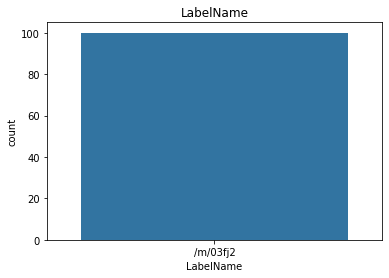

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


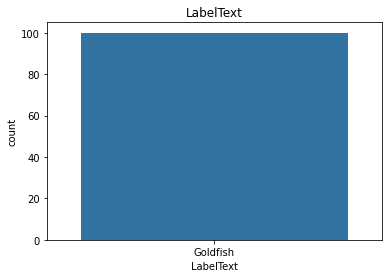

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


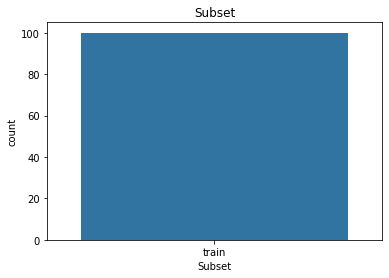

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


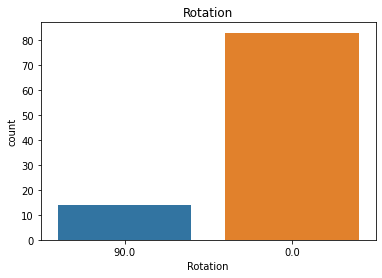

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


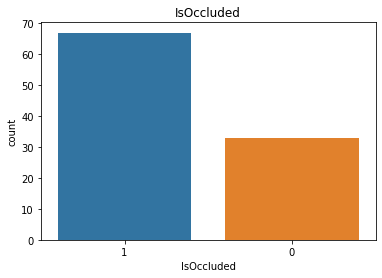

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


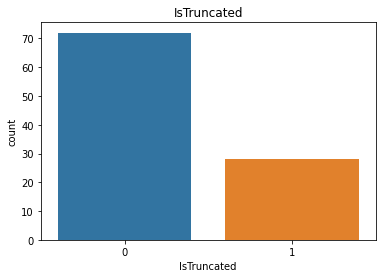

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


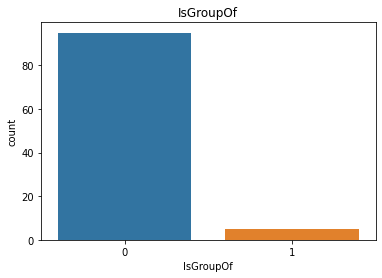

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


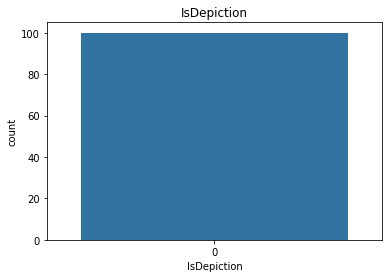

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


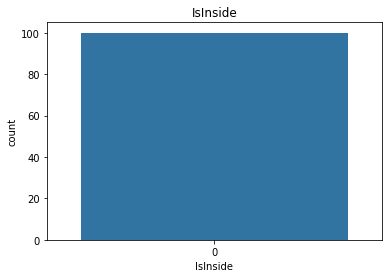

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


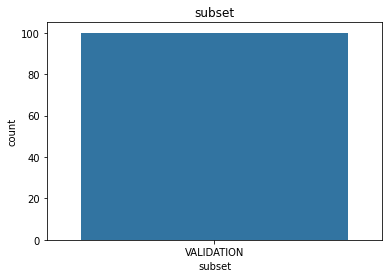

/scratch/data603_admin/venv/lib64/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


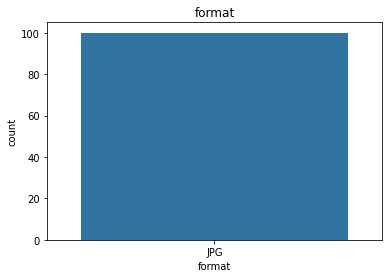

In [61]:
for feature in a.columns:
    plt.title(feature)
    sns.countplot(a[feature])
    plt.show()

### ---------------------------------------------------------------------------------------------------------------------------------- 

# Code to open the random image from the above final dataset

In [62]:
import requests
from PIL import Image
import PIL.Image
import io

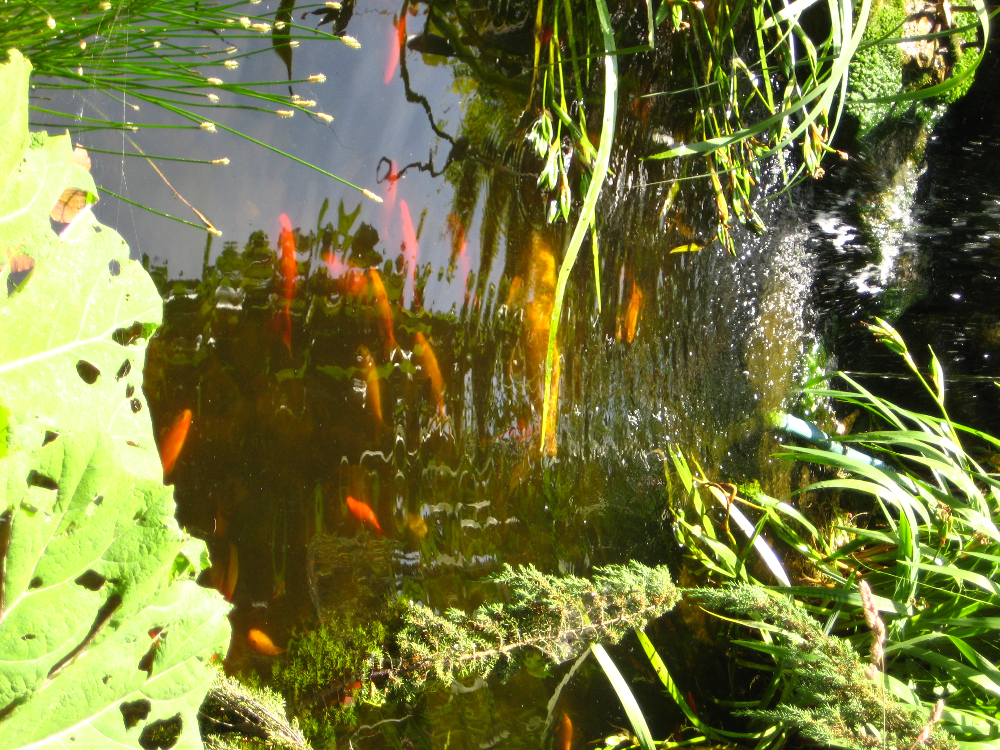

In [63]:
url = df['OriginalURL'][2]
res = requests.get(url, stream = True)
img = PIL.Image.open(io.BytesIO(res.content))
img

### ---------------------------------------------------------------------------------------------------------------------------------- 

# Croping the above generated image using the boundigbox information that is available

In [64]:
def update(data,XMin,YMin,XMax,YMax):
    im =  PIL.Image.open(io.BytesIO(data))
    w,h=im.size
    #print(w,h)
    XMin *= w
    XMax *= w
    YMin *= h
    YMax *= h
    return XMin,YMin,XMax,YMax

In [65]:
def show_subimage(data,XMin,YMax,XMax,YMin):
    im = PIL.Image.open(io.BytesIO(data))
    cropped_im = im.crop((XMin,YMax,XMax,YMin))
    buf = io.BytesIO()
    cropped_im.save(buf, format='JPEG')
    byte_im = buf.getvalue()
    return bytearray(byte_im)

In [66]:
subimage = []
dataframe = df.copy()
for index in range(dataframe.shape[0]):
    data = dataframe['data'][index]
    XMin = dataframe['XMin'][index]
    XMax = dataframe['XMax'][index]
    YMin = dataframe['YMin'][index]
    YMax = dataframe['YMax'][index]
    XMin,YMin,XMax,YMax = update(data,XMin,YMin,XMax,YMax)
    subimage.append(show_subimage(data,XMin,YMin,XMax,YMax))

In [67]:
df['subimage'] = subimage

In [68]:
df.columns

Index(['ImageID', 'LabelName', 'Source', 'Confidence', 'LabelText', 'Subset',
       'OriginalURL', 'OriginalLandingURL', 'License', 'AuthorProfileURL',
       'Author', 'Title', 'OriginalSize', 'OriginalMD5', 'Thumbnail300KURL',
       'Rotation', 'Source', 'Confidence', 'XMin', 'XMax', 'YMin', 'YMax',
       'IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction', 'IsInside',
       'subset', 'format', 'data', 'subimage'],
      dtype='object')

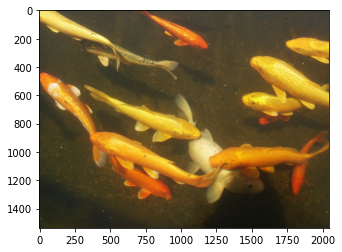

In [69]:
link = df['OriginalURL'][25]
res = requests.get(link, stream = True)
img = PIL.Image.open(io.BytesIO(res.content))
# img = img.resize((224,224))
plt.imshow(img)

Goldfish


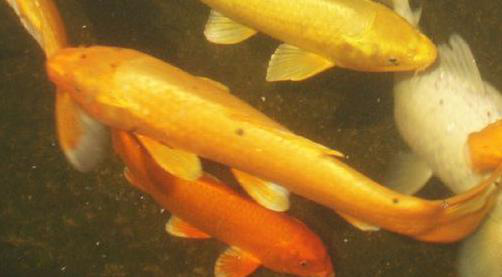

Goldfish


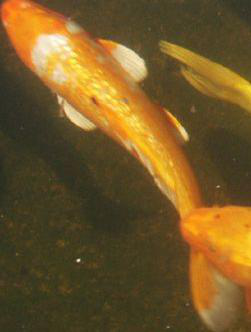

Goldfish


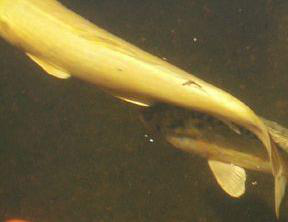

Goldfish


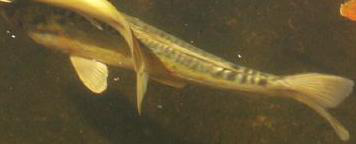

Goldfish


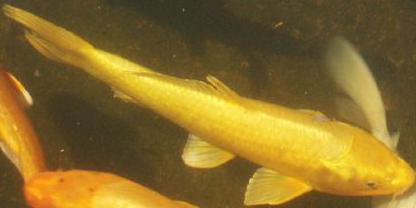

Goldfish


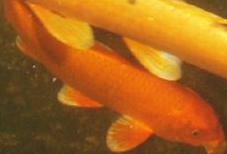

Goldfish


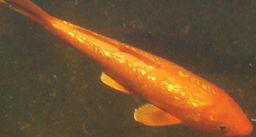

Goldfish


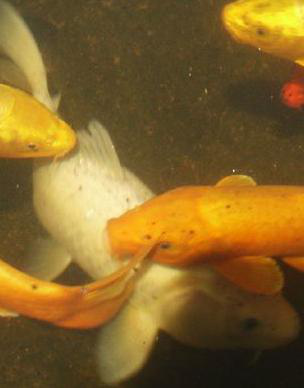

Goldfish


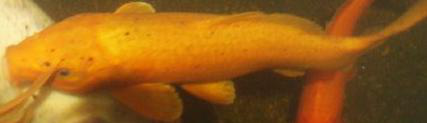

Goldfish


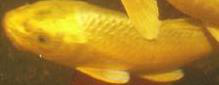

In [70]:
for i in range(20,30):
    data=df['subimage'][i]
    im = PIL.Image.open(io.BytesIO(data))
    print(df['LabelText'][i])
    im.show()

### ---------------------------------------------------------------------------------------------------------------------------------- 

# Generating the weights file for the MobileNet model

In [71]:
from tensorflow.python.keras.applications.mobilenet import MobileNet
import os

In [72]:
model = MobileNet()

In [73]:
os.listdir(f"{os.environ['HOME']}/.keras/models")

['mobilenet_1_0_224_tf.h5',
 'imagenet_class_index.json',
 'mobilenet_1_0_128_tf_no_top.h5',
 'mobilenet_1_0_224_tf_no_top.h5']

In [74]:
!cp {os.environ['HOME']}/.keras/models/mobilenet_1_0_224_tf.h5 .

In [75]:
model = MobileNet(weights='mobilenet_1_0_224_tf.h5')

In [76]:
model.summary()

Model: "mobilenet_1.00_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32

### ---------------------------------------------------------------------------------------------------------------------------------- 

# Running the MobileNet Prediction model to predict the type of image that we pass.

In [77]:
from keras.preprocessing.image import img_to_array
from keras.applications.mobilenet import preprocess_input
from keras.preprocessing.image import array_to_img
from keras.applications.mobilenet import decode_predictions
import matplotlib.pyplot as plt
from IPython.display import Image
import tensorflow as tf
import numpy as np

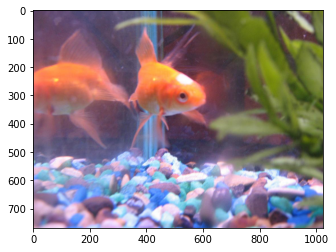

In [78]:
img1 = PIL.Image.open(io.BytesIO(df['data'][56]))
plt.imshow(img1)

(224, 224)


[[('n01443537', 'goldfish', 0.99998784),
  ('n01632777', 'axolotl', 1.1720484e-05),
  ('n02606052', 'rock_beauty', 3.7635e-07),
  ('n01440764', 'tench', 2.6763761e-08),
  ('n01494475', 'hammerhead', 2.1914637e-08)]]

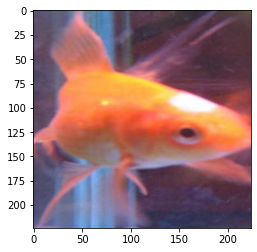

In [79]:
img = PIL.Image.open(io.BytesIO(df['subimage'][56]))
img = img.resize((224,224))
print(img.size)
img.save('predict_image.jpg')
plt.imshow(img)
image = img_to_array(img)
image = np.expand_dims(image,axis=0)
image = tf.keras.applications.mobilenet.preprocess_input(image)
yhat = model.predict(image)
label = decode_predictions(yhat)
label

### ---------------------------------------------------------------------------------------------------------------------------------- 

# Adding new data that contains different features into the hdfs directory and running he prediction using that data

In [80]:
hdfs.mkdir('/user/ty99095/projectfiles')

In [81]:
!hadoop fs -copyFromLocal 'data.csv' '/user/ty99095/projectfiles'
!hadoop fs -copyFromLocal 'predict_image.jpg' '/user/ty99095/projectfiles'

copyFromLocal: `/user/ty99095/projectfiles/data.csv': File exists
copyFromLocal: `/user/ty99095/projectfiles/predict_image.jpg': File exists


In [82]:
hdfs.ls('/user/ty99095/projectfiles')

['/user/ty99095/projectfiles/data.csv',
 '/user/ty99095/projectfiles/predict_image.jpg']

In [83]:
test = spark.read.csv('/user/ty99095/projectfiles/data.csv', header = True)

### ---------------------------------------------------------------------------------------------------------------------------------- 

# Running MobileNet Prediction by adding new layers to the exsisting model using different feature that we added to the hdfs directory(Custom Work) 

In [ ]:
from tensorflow.keras.layers import AveragePooling2D, Dense
import cv2

In [ ]:
def data_convert(data):
    im = PIL.Image.open(io.BytesIO(data))
    im.save('n.JPG')
    img_array = cv2.imread('n.JPG')
    result = cv2.resize(img_array,(50,50))
    return result

In [ ]:
def url_to_data(url):
    res = requests.get(url, stream = True)
    img = PIL.Image.open(io.BytesIO(res.content))
    img.save('n.JPG')
    img_array = cv2.imread('n.JPG')
    result = cv2.resize(img_array,(50,50))
    return result

In [ ]:
batch_size = 32
IMG_SHAPE = (244, 244, 3)

In [ ]:
base_model = tf.keras.applications.MobileNet(input_shape=IMG_SHAPE, include_top=False)
# base_model.trainable = False

base_model = tf.keras.Sequential([
    base_model,
    keras.layers.Conv2D(256, (3, 3)),
    # keras.layers.Conv2D(256, (3, 3)),
    # keras.layers.Activation('relu'),
    # keras.layers.MaxPooling2D(pool_size=(2, 2)),
    # keras.layers.DepthwiseConv2D((3, 3)),
    # keras.layers.BatchNormalization(),
    # keras.layers.Conv2D(256, (3, 3)),
    # keras.layers.Activation('relu'),
    # keras.layers.MaxPooling2D(pool_size=(2, 2)),

#     model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors

#     model.add(Dense(64))

#     model.add(Dense(1))
    # keras.layers.Activation('sigmoid'),
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dense(1000, activation='relu')
])

base_model.summary()

base_model.compile(optimizer='nadam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenet_1.00_224 (Function (None, 7, 7, 1024)        3228864   
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 5, 5, 256)         2359552   
_________________________________________________________________
global_average_pooling2d_5 ( (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1000)              257000    
Total params: 5,845,416
Trainable params: 5,823,528
Non-trainable params: 21,888
_________________________________________________________________


In [ ]:
test.show()

,URL,LabelText
0,https://th.bing.com/th/id/OIP.75tqaS7n_3meZFWu...,old english sheepdog
1,https://th.bing.com/th/id/OIP.wQjWPuS2sSdqtmJZ...,old english sheepdog
2,https://th.bing.com/th/id/OIP.JdSrrO3uHGNrWcik...,old english sheepdog
3,https://th.bing.com/th/id/OIP.-LD7lh7gadVUQ-XT...,old english sheepdog
4,https://th.bing.com/th/id/OIP.7clrjZl68z4tWk-D...,old english sheepdog


In [ ]:
testdf = test.toPandas()

<Response [200]>


[[('n02086079', 'Pekinese', 3.1024077),
  ('n01630670', 'common_newt', 2.7455525),
  ('n04346328', 'stupa', 2.7354543),
  ('n03534580', 'hoopskirt', 2.682345),
  ('n02086240', 'Shih-Tzu', 2.6228442)]]

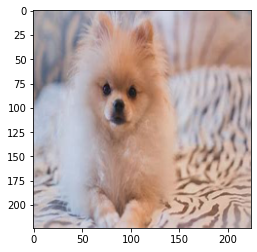

In [ ]:
# for i in range(testdf.shape[0]):
#     if i==48:
#         continue
#     print(i)
link = testdf['URL'][13]
res = requests.get(link, stream = True)
print(res)
img = PIL.Image.open(io.BytesIO(res.content))
img = img.resize((224,224))
plt.imshow(img)
image = img_to_array(img)
image = np.expand_dims(image,axis=0)
image = tf.keras.applications.mobilenet.preprocess_input(image)
yhat = base_model.predict(image)
label = decode_predictions(yhat)
label

# Runing prediction on Image Chip Data using MobileNet model

In [84]:
def evaluate_chip(chip_data):
    import io
    import os
    import tempfile
    from keras.applications.mobilenet import MobileNet
    from keras.applications.mobilenet import preprocess_input
    from keras.applications.mobilenet import decode_predictions
    from keras.preprocessing.image import load_img
    from keras.preprocessing.image import img_to_array
    with tempfile.TemporaryDirectory(dir=f'{os.getcwd()}') as td:
        f_name = os.path.join(td, 'google_open_image_chip')
        with open(f_name, 'wb') as fh:
            fh.write(chip_data)
        img = load_img(f_name, target_size = (224,224))
    image = img_to_array(img)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    model = MobileNet(weights = f'{os.getcwd()}/mobilenet_1_0_224_tf.h5',
                 include_top = True,
                 alpha = 1.0)
    yhat = model.predict(image)
    label = decode_predictions(yhat)
    label = label[0][0]
    ret = {label[1]: float(label[2])}   
    return ret

In [85]:
with hdfs.open('/user/ty99095/projectfiles/predict_image.jpg', 'rb') as f:
   img_bytes = f.read()
evaluate_chip(img_bytes)

{'goldfish': 0.9999746084213257}

# Permission to view the files for the project

In [86]:
# hdfs.chmod('/user/ty99095/projectfiles', 0o0755)